In [10]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
from numpy import zeros
from numpy import ones
from numpy.random import randn
from numpy.random import randint
#from keras.datasets.cifar10 import load_data
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout

from matplotlib import pyplot as plt
import torch
from torch import nn

import math
import matplotlib.pyplot as plt



In [11]:
dataroot = "/kaggle/input/utkface-new"
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


input data

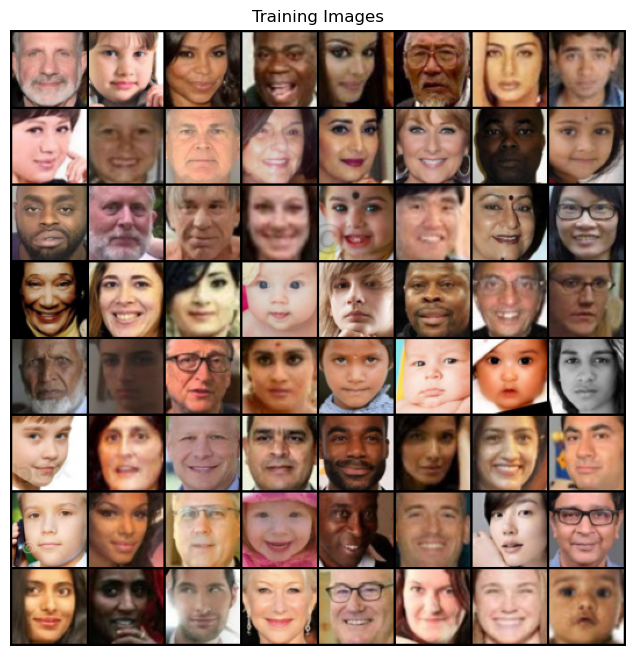

In [12]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)



# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

implementation

In [13]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

generater

In [14]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            self.make_layer(nz, ngf * 8, 4, 1, 0, bias=False),
            # state size. (ngf*8) x 4 x 4
            self.make_layer(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            # state size. (ngf*4) x 8 x 8
            self.make_layer(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            # state size. (ngf*2) x 16 x 16
            self.make_layer(ngf * 2, ngf, 4, 2, 1, bias=False),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)
    def make_layer(self,n_input, n_output, k_size, stride, padding, bias):
        return nn.Sequential(
            nn.ConvTranspose2d(n_input, n_output, k_size, stride, padding, bias=bias),
            nn.BatchNorm2d(n_output),
            nn.ReLU(True)
        )
    
    
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            self.make_layer(ndf, ndf * 2, 4, 2, 1, bias=False),
            # state size. (ndf*2) x 16 x 16
            self.make_layer(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            # state size. (ndf*4) x 8 x 8
            self.make_layer(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
    def make_layer(self,n_input, n_output, k_size, stride, padding, bias):
        return nn.Sequential(
            nn.Conv2d(n_input, n_output, k_size, stride, padding, bias=bias),
            nn.BatchNorm2d(n_output ),
            nn.LeakyReLU(0.2, inplace=True),
        )
    def forward(self, input):
        return self.main(input)
    

    
# Create the generator
G = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    G = nn.DataParallel(G, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
G.apply(weights_init)

# Print the model
print(G)

# Create the Discriminator
D = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    D = nn.DataParallel(D, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
D.apply(weights_init)

# Print the model
print(D)

Generator(
  (main): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=T

In [15]:
# Calculate losses
def real_loss(D_out, smooth=False):
    # label smoothing
    b_size = D_out.size(0)
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.full((b_size,), 1, dtype=torch.float, device=device)*0.9
    else:
        labels = torch.full((b_size,), 1, dtype=torch.float, device=device) # real labels = 1
        
    # numerically stable loss
    criterion = nn.BCELoss()
    # calculate loss
    loss = criterion(D_out, labels)
    return loss

def fake_loss(D_out):
    b_size = D_out.size(0)
    labels  = torch.full((b_size,), 0, dtype=torch.float, device=device) # fake labels = 0
    criterion = nn.BCELoss()
    # calculate loss
    loss = criterion(D_out, labels)
    return loss

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5
# Setup Adam optimizers for both G and D
d_optimizer = optim.Adam(D.parameters(), lr=lr, betas=(beta1, 0.999))
g_optimizer = optim.Adam(G.parameters(), lr=lr, betas=(beta1, 0.999))

Epoch [    1/    5] | d_loss: 2.1964 | g_loss: 5.2563


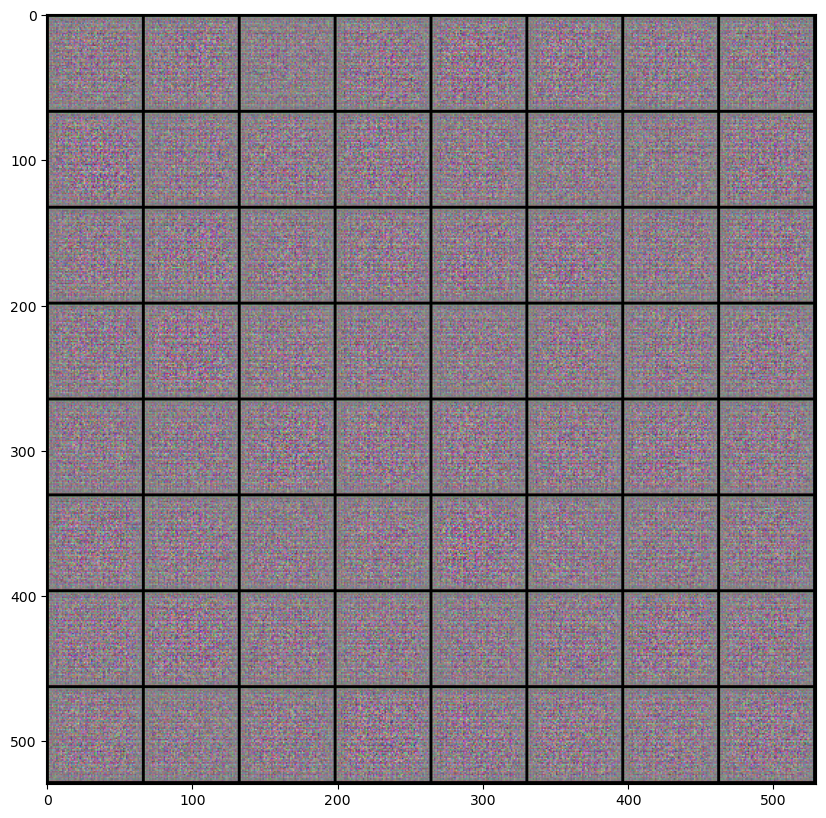

Epoch [    2/    5] | d_loss: 0.5627 | g_loss: 4.9462


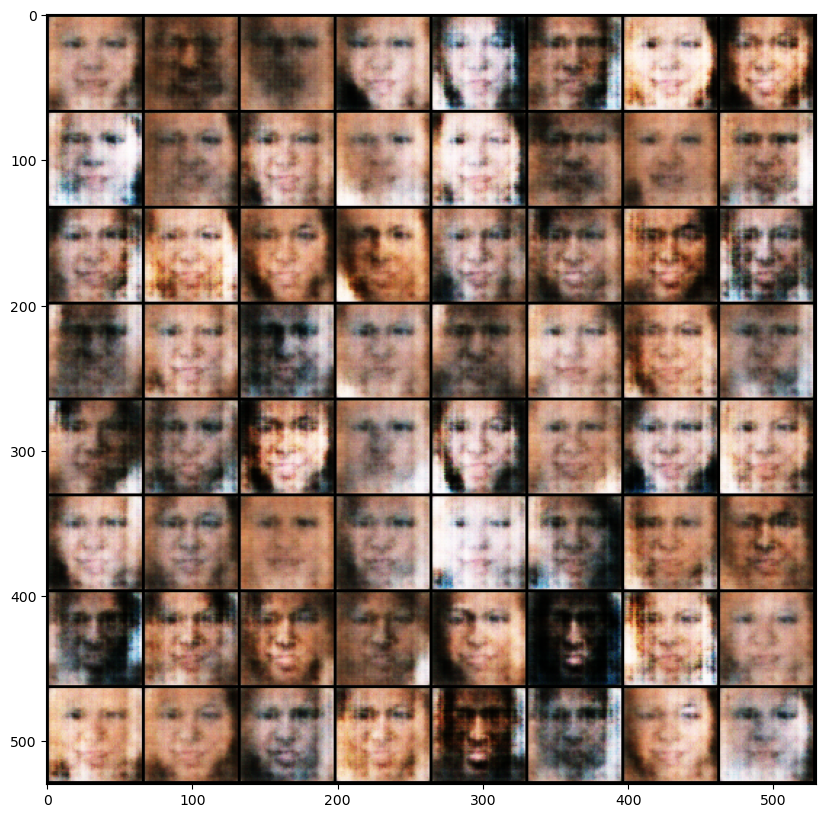

Epoch [    3/    5] | d_loss: 0.6173 | g_loss: 3.0336


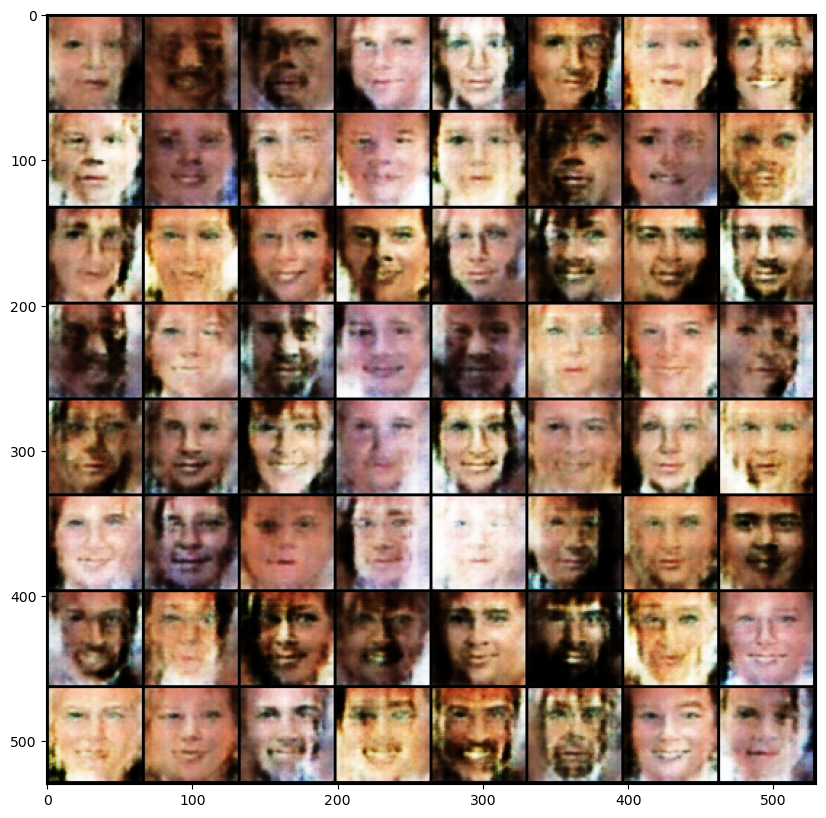

Epoch [    4/    5] | d_loss: 0.5656 | g_loss: 3.4633


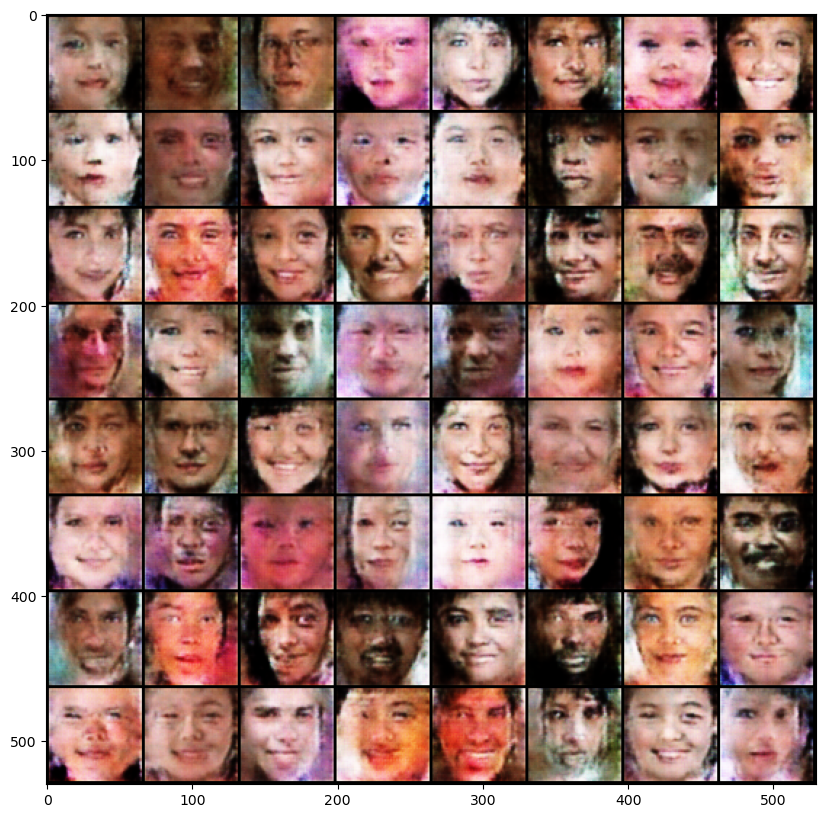

Epoch [    5/    5] | d_loss: 0.7436 | g_loss: 3.2655


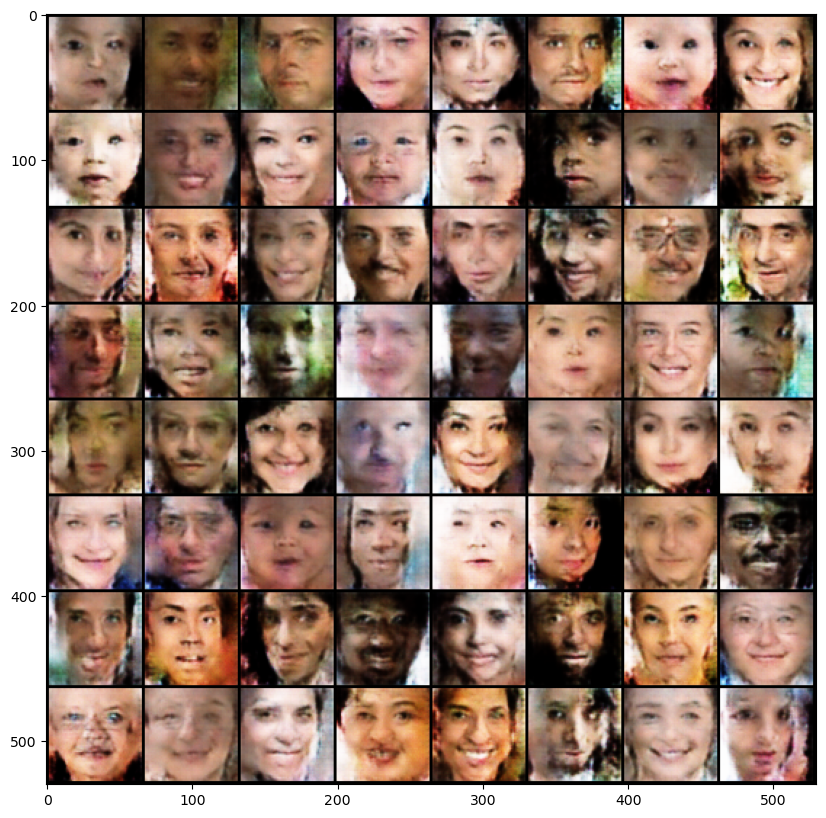

KeyboardInterrupt: 

In [16]:
# Training Loop
losses = []
iters = 0
print_every = 800
samples = []
# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_z = torch.randn(64, nz, 1, 1, device=device)
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for batch_i, data in enumerate(dataloader, 0):
        
        ## Important rescaling step ## 
        # ============================================
        #            TRAIN THE DISCRIMINATOR
        # ============================================
        D.zero_grad()
        
        real_img = data[0].to(device)
        b_size = real_img.size(0)
        
        # 1. Train with real images

        # Compute the discriminator losses on real images 
        # smooth the real labels
        D_real = D(real_img).view(-1)
        d_real_loss = real_loss(D_real, smooth=True).to(device)
        d_real_loss.backward()

        # 2. Train with fake images

        # Generate fake images
        # gradients don't have to flow during this step

        z = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake images
        fake_img = G(z)
        # Compute the discriminator losses on fake images  
        D_fake = D(fake_img.detach()).view(-1)
        d_fake_loss = fake_loss(D_fake)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        # add up loss and perform backprop
        d_fake_loss.backward()
        d_optimizer.step()
        
        d_loss = d_real_loss + d_fake_loss
        
        

       
        # =========================================
        #            TRAIN THE GENERATOR
        # =========================================
        G.zero_grad()
        # Compute the discriminator losses on fake images 
        # using flipped labels!
        D_fake = D(fake_img).view(-1)
        g_loss = real_loss(D_fake) # use real loss to flip labels
        
        # perform backprop
        g_loss.backward()
        
        g_optimizer.step()
        
        # Print some loss stats
        if batch_i % print_every == 0:
#             if epoch % 4 ==0:
          # print discriminator and generator loss
                print('Epoch [{:5d}/{:5d}] | d_loss: {:6.4f} | g_loss: {:6.4f}'.format(
                epoch+1, num_epochs, d_loss.item(), g_loss.item()))
                samples_z = G(fixed_z).detach().cpu()
                samples.append(samples_z)
                
                with torch.no_grad():
                    fake_img = G(fixed_z).detach().cpu()
                    fake_img = vutils.make_grid(fake_img, padding=2, normalize=True)
                    samples.append(fake_img)
                    plt.figure(figsize=(10,10))
                    plt.imshow(samples[-1].permute(1,2,0))
                    plt.show()
        # append discriminator loss and generator loss
        losses.append((d_loss.item(), g_loss.item()))
        
    ## AFTER EACH EPOCH##
    
    # generate and save sample, fake images
    G.eval() # eval mode for generating samples
    G.train() # back to train mode

result

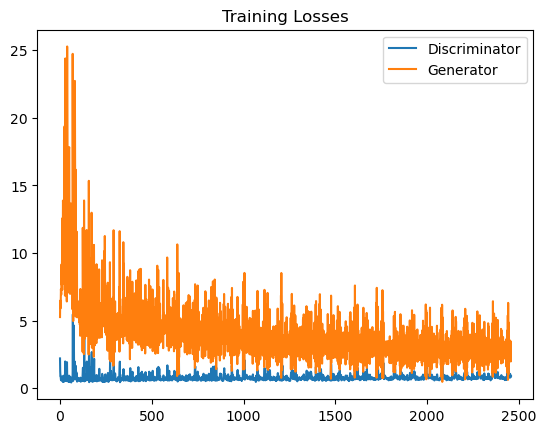

In [17]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator')
plt.plot(losses.T[1], label='Generator')
plt.title("Training Losses")
plt.legend()


Real Images vs. Fake Images



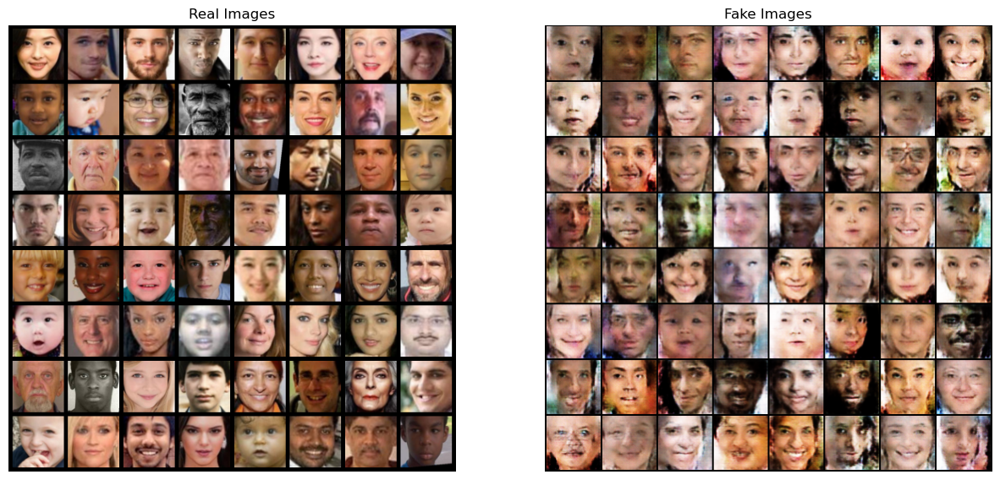

In [18]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(samples[-1],(1,2,0)))
plt.show()

interpolate

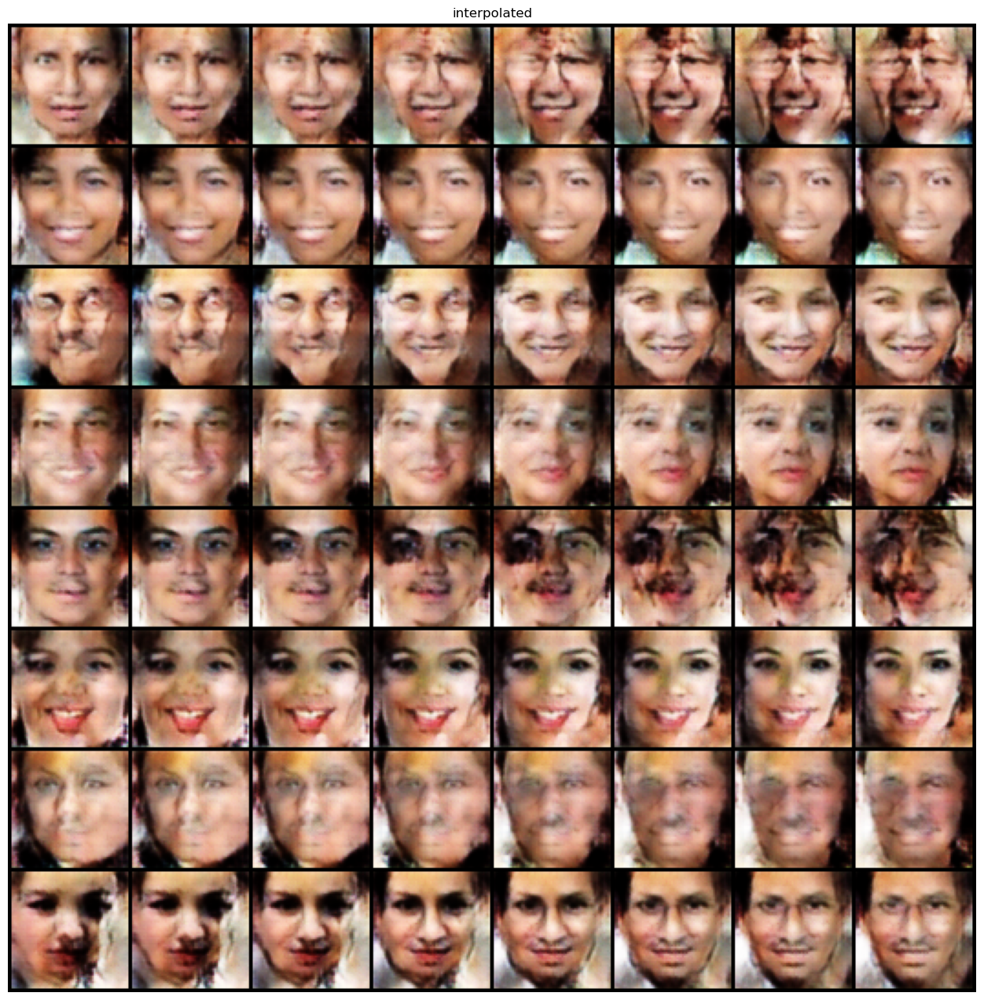

In [19]:
list_images = []
def interpolate(z1,z2,n_step = 8):
    p = torch.linspace(0,1,steps = n_step)
    for i in p:
        noise__z = (1.0-i)*z1 + i*z2
        noise__z = noise__z.unsqueeze(0)
        fake = G(noise__z).detach().cpu()
        list_images.append(vutils.make_grid(fake, padding=2, normalize=True))
        

for i in range (0,8):
    noise = torch.randn(2, 100,1,1, device=device)
    interpolated = interpolate(noise[0],noise[1])

plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("interpolated")
plt.imshow(np.transpose(vutils.make_grid(list_images[:64], padding=2, normalize=True).cpu(),(1,2,0)))